Ashok: on .182 , use nlp_1 conda env

In [2]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
import pandas as pd
import json

In [3]:
import torch
# from pipeline import prepare_data, task1_entailment,task2_evidence

In [4]:
def generate_nli_data(file_path):
    '''
    Generates data from clinical trials for Task 1: Textual entailment (NLI).

    Parameters:
        file_path (str): Path to the JSON of the dataset.

    Returns:
        joint_data: List of training instances in form of "claim [SEP] evidence_text" (str)
        labels: List of labels, either 1 for "Entailment" or 0 for "Contradiction" (int)
    '''

    #Read the file.
    df = pd.read_json(file_path)
    df = df.transpose()

    #Extract claims and labels. Map labels to binary values (0, 1).
    claims = df.Statement.tolist()
    labels = df.Label.tolist()
    labels = list(map(lambda x : 1 if x == "Entailment" else 0, labels))

    #(Prepare to) Extract all evidence sentences from clinical trials
    evidence_texts = list()
    primary_cts, secondary_cts = df.Primary_id, df.Secondary_id    
    primary_indices = df.Primary_evidence_index 
    secondary_indices = df.Secondary_evidence_index
    sections, types = df.Section_id, df.Type

    #Generate evidence texts for each claim.
    for claim_id in range(len(claims)):
        file_name = "/kaggle/input/nlp-project-dataset/Training data/CT json/" + primary_cts[claim_id] + ".json"

        with open(file_name, 'r') as f:
            data = json.load(f)
            evidence = "primary trial: " 

            #Evidence for the primary trial is in form:
            # "primary trial: sent_1. sent_2. (...) sent_n."           
            for i in primary_indices[claim_id]:
                evidence += data[sections[claim_id]][i]
                evidence += " "
                
        #If it is a comparative claim, also add evidence sentences from the 2nd trial.
        if types[claim_id] == "Comparison":
            file_name = "/kaggle/input/nlp-project-dataset/Training data/CT json/" + secondary_cts[claim_id] + ".json"

            #Evidence for the secondary trial is in form:
            # "| secondary trial: sent_1. sent_2. (...) sent_n."
            with open(file_name, 'r') as f:
                data = json.load(f)
                evidence += " | secondary trial: "
                for i in secondary_indices[claim_id]:
                    evidence += data[sections[claim_id]][i]
                    evidence += " "

        evidence_texts.append(evidence)

    #One training instance is: "claim [SEP] full_evidence_text"
    joint_data = list()
    for i in range(len(claims)):
        premise = claims[i]
        hypothesis = evidence_texts[i]
        joint = premise + " [SEP] " + hypothesis
        joint_data.append(joint)

    return joint_data, labels

In [5]:
model_name = "MoritzLaurer/DeBERTa-v3-large-mnli-fever-anli-ling-wanli"
# task1_entailment.train(model_name)
# task2_evidence.train(model_name)

# picking the misclassified examples

In [6]:
#One training instance is: BERT_TOKENIZER("claim [SEP] evidence_text").
class CtDataset(torch.utils.data.Dataset):
    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = labels

    def __getitem__(self, idx):
        item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
        item['labels'] = torch.tensor(self.labels[idx])
        return item

    def __len__(self):
        return len(self.labels)
    
# from pipeline.prepare_data import generate_nli_data
# from pipeline.task1_entailment import CtDataset
from transformers import AutoTokenizer, AutoModelForSequenceClassification

# trained model checkpoint
model_nli_path = "/kaggle/input/sebis-final-model"
DEV_PATH = "/kaggle/input/nlp-project-dataset/Training data/dev.json"


# load model and tokenizer
# tokenizer = AutoTokenizer.from_pretrained(model_nli_path, model_max_length=1024)
tokenizer = AutoTokenizer.from_pretrained("MoritzLaurer/DeBERTa-v3-small-mnli-fever-docnli-ling-2c")
model = AutoModelForSequenceClassification.from_pretrained(model_nli_path,
                                num_labels=2, ignore_mismatched_sizes=True)


joint_dev, labels_dev= generate_nli_data(DEV_PATH)

encoded_dev = tokenizer(joint_dev, return_tensors='pt',
                        truncation_strategy='only_first', add_special_tokens=True, padding=True)
dev_dataset = CtDataset(encoded_dev, labels_dev)


tokenizer_config.json:   0%|          | 0.00/500 [00:00<?, ?B/s]

spm.model:   0%|          | 0.00/2.46M [00:00<?, ?B/s]

added_tokens.json:   0%|          | 0.00/18.0 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/156 [00:00<?, ?B/s]

/opt/conda/lib/python3.10/site-packages/transformers/convert_slow_tokenizer.py:550: UserWarning: The sentencepiece tokenizer that you are converting to a fast tokenizer uses the byte fallback option which is not implemented in the fast tokenizers. In practice this means that the fast version of the tokenizer can produce unknown tokens whereas the sentencepiece version would have converted these unknown tokens into a sequence of byte tokens matching the original piece of text.
  warnings.warn(
/tmp/ipykernel_34/559848451.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  file_name = "/kaggle/input/nlp-project-dataset/Training data/CT json/" + primary_cts[claim_id] + ".json"
/tmp/ipykernel_34/559848451.py:39: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future versi

In [7]:
device = "cuda" if torch.cuda.is_available() else "cpu"

incorrect_sample_ids = []

N_SAMPLES = 200
# checks the first N_SAMPLES samples; len(dev_dataset) = 200
for i in range(N_SAMPLES):
    one_sample = dev_dataset[i]
    input_ids = one_sample['input_ids'].unsqueeze(0).to(device)
    attention_mask = one_sample['attention_mask'].unsqueeze(0).to(device)
    label = one_sample['labels'].unsqueeze(0).to(device)

    model.to(device)
    model.eval()

    with torch.no_grad():
        logits = model(input_ids, attention_mask=attention_mask).logits
        pred = logits.argmax(dim=1)
        # print(pred, label)
        if pred != label:
            incorrect_sample_ids.append(i)
            
        

/tmp/ipykernel_34/273749820.py:8: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}


In [8]:
print(incorrect_sample_ids)

[0, 4, 8, 12, 13, 16, 18, 19, 20, 25, 26, 30, 34, 36, 58, 62, 63, 64, 67, 71, 72, 77, 87, 97, 99, 102, 104, 107, 109, 110, 111, 121, 125, 128, 131, 132, 134, 136, 138, 139, 144, 145, 146, 148, 153, 160, 161, 162, 167, 168, 169, 173, 181, 182, 183, 186, 190, 191, 195]


In [18]:
# saveing the incorrect sample ids. so that i dont have to run the above code again
incorrect_sample_ids = "0, 4, 8, 12, 13, 16, 18, 19, 20, 25, 26, 30, 34, 36, 58, 62, 63, 64, 67, 71, 72, 77, 87, 97, 99, 102, 104, 107, 109, 110, 111, 121, 125, 128, 131, 132, 134, 136, 138, 139, 144, 145, 146, 148, 153, 160, 161, 162, 167, 168, 169, 173, 181, 182, 183, 186, 190, 191, 195".split(', ')
incorrect_sample_ids = [int(i) for i in incorrect_sample_ids]

print(*incorrect_sample_ids)

0 4 8 12 13 16 18 19 20 25 26 30 34 36 58 62 63 64 67 71 72 77 87 97 99 102 104 107 109 110 111 121 125 128 131 132 134 136 138 139 144 145 146 148 153 160 161 162 167 168 169 173 181 182 183 186 190 191 195


In [19]:
for idx in incorrect_sample_ids:
    claim, premise = joint_dev[idx].split("[SEP]")
    #inverse of the label mapping
    label = "Entailment" if labels_dev[idx] == 1 else "Contradiction"
    
    print(f"claim: \n{claim} \n\npremise: \n{premise} \nlabel: {label}")
    print("-"*50)
    # break

claim: 
there is a 13.2% difference between the results from the two the primary trial cohorts  

premise: 
 primary trial: Outcome Measurement:    Event-free Survival   Event free survival, the primary endpoint of this study, is defined as the time from randomization to the time of documented locoregional or distant recurrence, new primary breast cancer, or death from any cause.   Time frame: 5 years Results 1:    Arm/Group Title: Exemestane   Arm/Group Description: Patients receive oral exemestane (25 mg) once daily for 5 years.   exemestane: Given orally   Overall Number of Participants Analyzed: 3789   Measure Type: Number   Unit of Measure: percentage of participants  88        (87 to 89) Results 2:    Arm/Group Title: Anastrozole   Arm/Group Description: Patients receive oral anastrozole (1 mg) once daily for 5 years.   anastrozole: Given orally   Overall Number of Participants Analyzed: 3787   Measure Type: Number   Unit of Measure: percentage of participants  89        (88 to 9

## check the distribution on section_id's and types

In [20]:
sections, types = generate_nli_data(DEV_PATH)

# count the number of incorrect samples in each section
incorrect_sections = {}
for idx in incorrect_sample_ids:
    section = sections[idx]
    incorrect_sections[section] = incorrect_sections.get(section, 0) + 1
print(incorrect_sections)

#count the number of incorrect samples in each type
incorrect_types = {}
for idx in incorrect_sample_ids:
    type_ = types[idx]
    incorrect_types[type_] = incorrect_types.get(type_, 0) + 1
print(incorrect_types)



{'there is a 13.2% difference between the results from the two the primary trial cohorts [SEP] primary trial: Outcome Measurement:    Event-free Survival   Event free survival, the primary endpoint of this study, is defined as the time from randomization to the time of documented locoregional or distant recurrence, new primary breast cancer, or death from any cause.   Time frame: 5 years Results 1:    Arm/Group Title: Exemestane   Arm/Group Description: Patients receive oral exemestane (25 mg) once daily for 5 years.   exemestane: Given orally   Overall Number of Participants Analyzed: 3789   Measure Type: Number   Unit of Measure: percentage of participants  88        (87 to 89) Results 2:    Arm/Group Title: Anastrozole   Arm/Group Description: Patients receive oral anastrozole (1 mg) once daily for 5 years.   anastrozole: Given orally   Overall Number of Participants Analyzed: 3787   Measure Type: Number   Unit of Measure: percentage of participants  89        (88 to 90) ': 1, 'Prio

/tmp/ipykernel_34/559848451.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  file_name = "/kaggle/input/nlp-project-dataset/Training data/CT json/" + primary_cts[claim_id] + ".json"
/tmp/ipykernel_34/559848451.py:39: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  for i in primary_indices[claim_id]:
/tmp/ipykernel_34/559848451.py:40: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  evidence += data[sections[claim_id]][i]
/tmp/ipykern

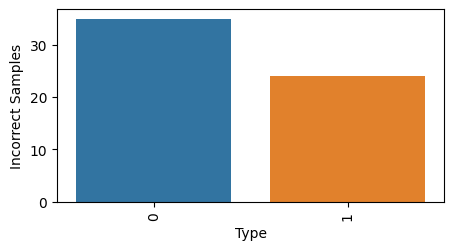

In [21]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
# df = pd.DataFrame(list(incorrect_sections.items()), columns=["Section", "Incorrect Samples"])

# plt.figure(figsize=(5, 2.5))
# sns.barplot(x="Section", y="Incorrect Samples", data=df)
# plt.xticks(rotation=90)
# plt.show()


df = pd.DataFrame(list(incorrect_types.items()), columns=["Type", "Incorrect Samples"])
plt.figure(figsize=(5, 2.5))
sns.barplot(x="Type", y="Incorrect Samples", data=df)
plt.xticks(rotation=90)
plt.show()

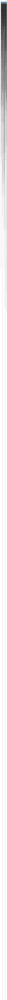

In [23]:
 # plot both in same graph overlayed
df = pd.DataFrame(list(sections_count_in_dev.items()), columns=["Section", "Count"])
df["Type"] = "Dev"
# df2 = pd.DataFrame(list(incorrect_sections.items()), columns=["Section", "Count"])
# df2["Type"] = "Incorrect"
# df = pd.concat([df, df2])

plt.figure(figsize=(5, 2.5))
sns.barplot(x="Section", y="Count", data=df, hue="Type")
plt.xticks(rotation=90)
plt.show()

# df = pd.DataFrame(list(types_count_in_dev.items()), columns=["Type", "Count"])
# df["Type"] = "Dev"
# df2 = pd.DataFrame(list(incorrect_types.items()), columns=["Type", "Count"])
# df2["Type"] = "Incorrect"
# df = pd.concat([df, df2])

# plt.figure(figsize=(5, 2.5))
# sns.barplot(x="Type", y="Count", data=df, hue="Type")
# plt.xticks(rotation=90)
# plt.show()
